In [1]:
import scanpy as sc
import anndata
from scipy import io
from scipy.sparse import coo_matrix, csr_matrix
import numpy as np
import os
import pandas as pd

import scvelo as scv
import cellrank as cr
import anndata as ad

scv.settings.verbosity = 3
scv.settings.set_figure_params('scvelo', facecolor='white', dpi=300, frameon=False)
cr.settings.verbosity = 2

In [ ]:
## Step 0: Load Full SC data

In [2]:
# load sparse matrix:
X = io.mmread("/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full.counts_mtx.gz")

In [3]:
# create anndata object
adata = anndata.AnnData(
    X=X.transpose().tocsr()
)

In [4]:
# load cell metadata:
cell_meta = pd.read_csv("/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full.srt_meta.csv.gz",
                        compression='gzip')


In [5]:
# load gene names:
with open("/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full.gene_names.csv", 'r') as f:
    gene_names = f.read().splitlines()
gene_names.pop(0)

'rownames(full.srt)'

In [6]:
# set anndata observations and index obs by barcodes, var by gene names
adata.obs = cell_meta
adata.obs.index = adata.obs['barcode']
adata.var.index = gene_names

In [7]:
# load dimensional reduction:
pca = pd.read_csv("/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full_scVI.srt_dim.csv.gz",
                 compression='gzip')
pca.index = adata.obs.index

In [8]:
# set pca and umap
adata.obsm['X_pca'] = pca.to_numpy()
adata.obsm['X_umap'] = np.vstack((adata.obs['UMAP_1'].to_numpy(), adata.obs['UMAP_2'].to_numpy())).T
adata.obsm['X_subumap'] = np.vstack((adata.obs['SUBUMAP_1'].to_numpy(), adata.obs['SUBUMAP_2'].to_numpy())).T
adata.obsm['X_macumap'] = np.vstack((adata.obs['MACUMAP_1'].to_numpy(), adata.obs['MACUMAP_2'].to_numpy())).T

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


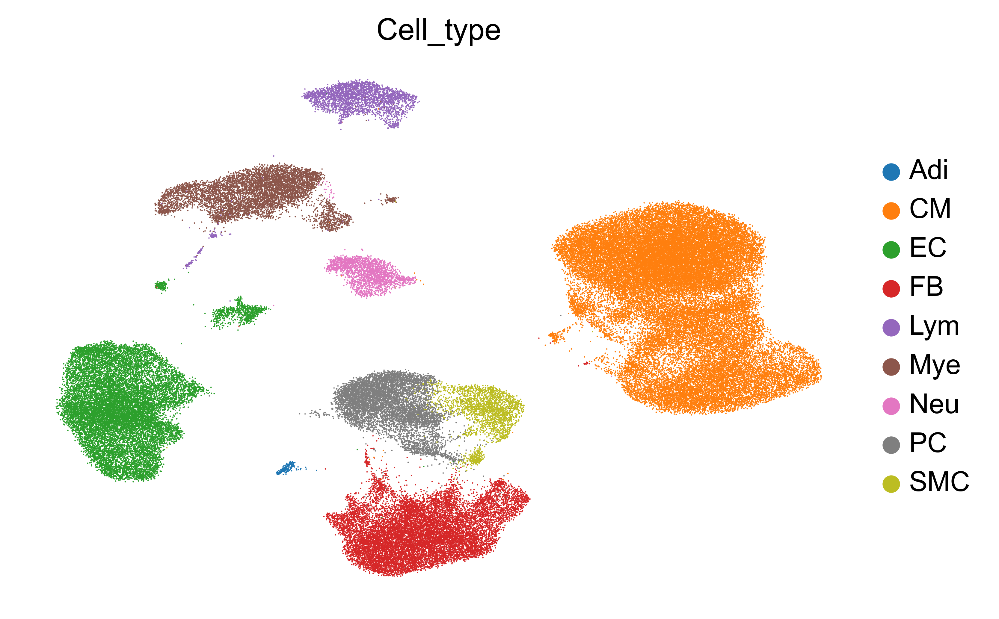

In [9]:
# plot a UMAP colored by sampleID to test:
sc.pl.umap(adata, color=['Cell_type'], frameon=False)

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


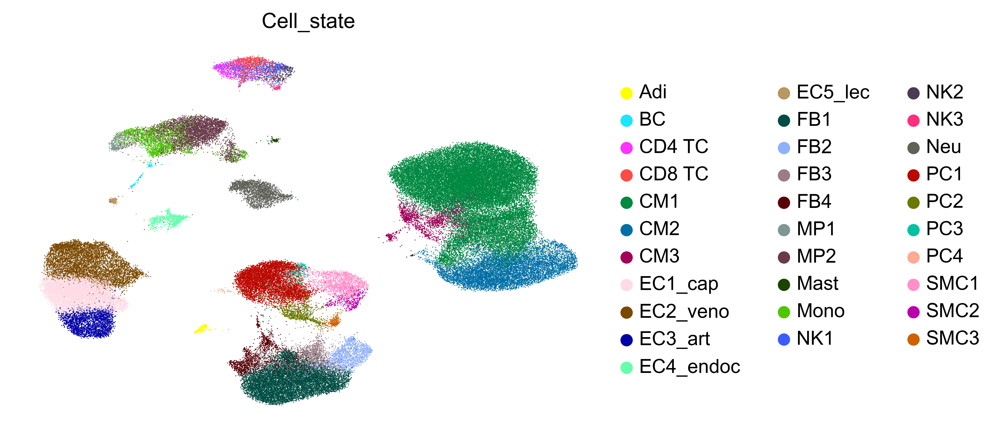

In [10]:
sc.pl.umap(adata, color=['Cell_state'], frameon=False)

In [11]:
# save dataset as anndata format
adata.write('/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/tmp/STEP30.full_scvelo.h5ad')

In [ ]:
# reload dataset
# adata = sc.read_h5ad('/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/tmp/STEP30.full_scvelo.h5ad')

In [ ]:
## Step 1: Load Velocyto data

In [12]:
# load loom files for spliced/unspliced matrices for each sample:
path1="/Volumes/shire/data/scrnaseq/"
path2="matrix/velocyto/"
Ctrl_01_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s4.loom")
Ctrl_01_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s5.loom")
Ctrl_01_loom_data3 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s11.loom")
Ctrl_01_loom_data4 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s12.loom")
Ctrl_02_loom_data1 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s6.loom")
Ctrl_02_loom_data2 = scv.read(path1+"2022_Nature_JMartin/"+path2+"2019_Unpub7_JMartin_ctrl_s7.loom")
Ctrl_03_loom_data = scv.read(path1+"2021_Circulation_EPorrello/"+path2+"2021_Circulation_EPorrello_Y2.loom")
Ctrl_04_loom_data = scv.read(path1+"2021_Circulation_EPorrello/"+path2+"2021_Circulation_EPorrello_Y3.loom")
HTX_01_loom_data = scv.read(path1+"2022_Unpub2_DTuraga/"+path2+"2022_Unpub2_DTuraga_P136_s1.loom")
HTX_02_loom_data = scv.read(path1+"2022_Unpub2_DTuraga/"+path2+"2022_Unpub2_DTuraga_P170_s1.loom")
HTX_03_loom_data = scv.read(path1+"2022_Unpub3_DTuraga/"+path2+"2022_Unpub3_DTuraga_P182.loom")


/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages

FileNotFoundError: Did not find file /Volumes/shire/data/scrnaseq/2022_Unpub3_DTuraga/matrix/velocyto/2022_Unpub2_DTuraga_P136_s1.loom.

In [14]:
## Rename all loom cell names to match the adata
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data1.obs.index.tolist()]
Ctrl_01_loom_data1.index = [bc[0:len(bc)-1] + '_1' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data2.obs.index.tolist()]
Ctrl_01_loom_data2.index = [bc[0:len(bc)-1] + '_2' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data3.obs.index.tolist()]
Ctrl_01_loom_data3.index = [bc[0:len(bc)-1] + '_3' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_01_loom_data4.obs.index.tolist()]
Ctrl_01_loom_data4.index = [bc[0:len(bc)-1] + '_4' for bc in barcodes]

barcodes = [bc.split(':')[1] for bc in Ctrl_02_loom_data1.obs.index.tolist()]
Ctrl_02_loom_data1.index = [bc[0:len(bc)-1] + '_5' for bc in barcodes]
barcodes = [bc.split(':')[1] for bc in Ctrl_02_loom_data2.obs.index.tolist()]
Ctrl_02_loom_data2.index = [bc[0:len(bc)-1] + '_6' for bc in barcodes]


barcodes = [bc.split(':')[1] for bc in Ctrl_03_loom_data.obs.index.tolist()]
Ctrl_03_loom_data.index = [bc[0:len(bc)-1] + '_7' for bc in barcodes]

barcodes = [bc.split(':')[1] for bc in Ctrl_04_loom_data.obs.index.tolist()]
Ctrl_04_loom_data.index = [bc[0:len(bc)-1] + '_8' for bc in barcodes]


barcodes = [bc.split(':')[1] for bc in HTX_01_loom_data.obs.index.tolist()]
HTX_01_loom_data.index = [bc[0:len(bc)-1] + '_9' for bc in barcodes]

barcodes = [bc.split(':')[1] for bc in HTX_02_loom_data.obs.index.tolist()]
HTX_02_loom_data.index = [bc[0:len(bc)-1] + '_10' for bc in barcodes]

barcodes = [bc.split(':')[1] for bc in HTX_03_loom_data.obs.index.tolist()]
HTX_03_loom_data.index = [bc[0:len(bc)-1] + '_11' for bc in barcodes]

In [15]:
# make variable names unique
Ctrl_01_loom_data1.var_names_make_unique()
Ctrl_01_loom_data2.var_names_make_unique()
Ctrl_01_loom_data3.var_names_make_unique()
Ctrl_01_loom_data4.var_names_make_unique()
Ctrl_02_loom_data1.var_names_make_unique()
Ctrl_02_loom_data2.var_names_make_unique()
Ctrl_03_loom_data.var_names_make_unique()
Ctrl_04_loom_data.var_names_make_unique()
HTX_01_loom_data.var_names_make_unique()
HTX_02_loom_data.var_names_make_unique()
HTX_03_loom_data.var_names_make_unique()

In [17]:
# concatenate the three loom
ldata = Ctrl_01_loom_data1.concatenate([
    Ctrl_01_loom_data2,
    Ctrl_01_loom_data3,
    Ctrl_01_loom_data4,
    Ctrl_02_loom_data1,
    Ctrl_02_loom_data2,
    Ctrl_03_loom_data,
    Ctrl_04_loom_data,
    HTX_01_loom_data,
    HTX_02_loom_data,
    HTX_03_loom_data
])

In [18]:
# merge matrices into the original adata object
adata = scv.utils.merge(adata, ldata)

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


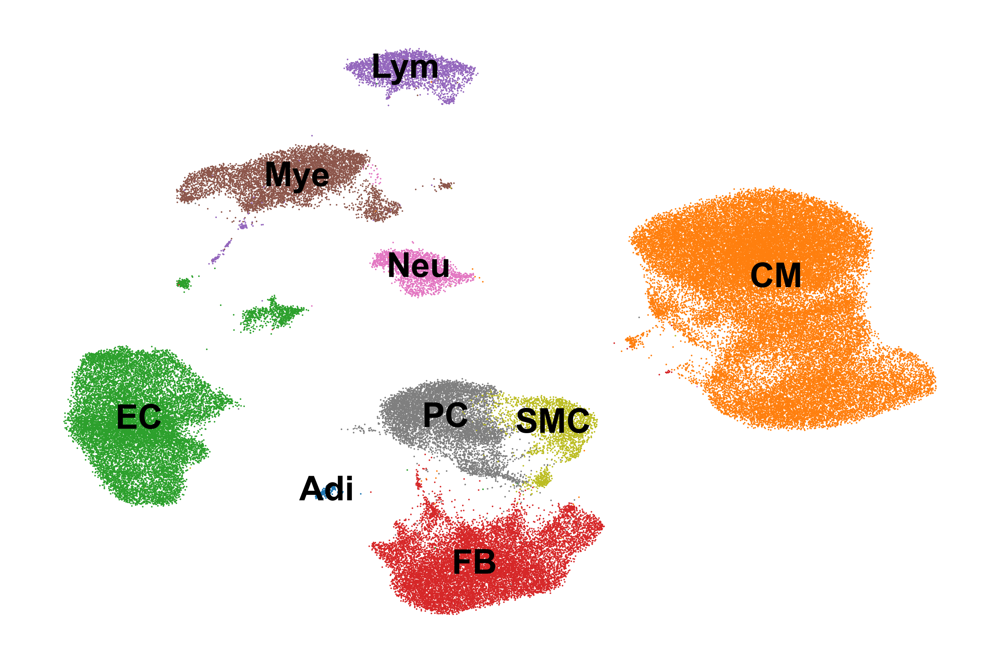

In [19]:
# plot umap to check
sc.pl.umap(adata, color='Cell_type', frameon=False, legend_loc='on data', title='')

In [20]:
adata

AnnData object with n_obs × n_vars = 96631 × 30516
    obs: 'sample', 'group1', 'group2', 'Cell_type', 'Cell_state', 'Origin', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MACUMAP_1', 'MACUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'Cell_type_colors', 'Cell_state_colors'
    obsm: 'X_pca', 'X_umap', 'X_subumap', 'X_macumap'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [ ]:
## Step 2: Computing RNA velocity using scVelo

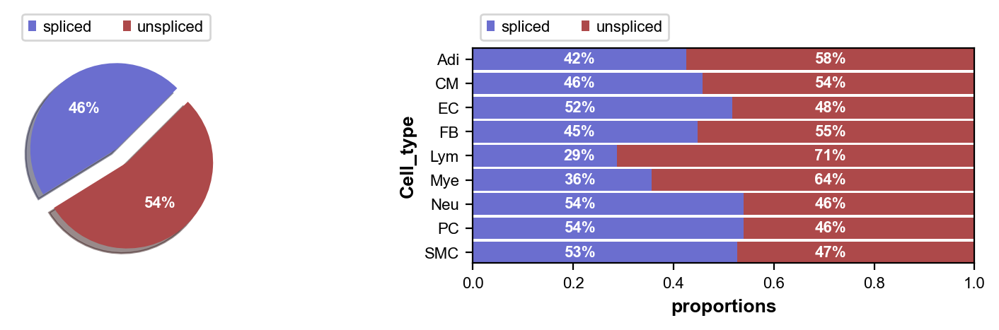

In [21]:
scv.pl.proportions(adata, groupby='Cell_type')

In [22]:
# pre-process
scv.pp.filter_and_normalize(adata)
scv.pp.moments(adata)

Normalized count data: X, spliced, unspliced.
computing neighbors
    finished (0:00:30) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:01:32) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [23]:
# save dataset
adata.write('/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full_scvelo.h5ad')

In [24]:
#### End of full data processing ####

In [27]:
#### Analysing Myeloid subset ####

In [40]:
# reload dataset
adata = sc.read_h5ad('/Volumes/bree/project/2022_acute_rejection_dturaga/rdata/human_v1/analysis/STEP30.full_scvelo.h5ad')

In [53]:
# subset for Myeloid cells
mye_adata = adata[adata.obs['Cell_type'] == 'Mye']

In [54]:
mye_adata = mye_adata[mye_adata.obs['group1'] == '5d PT']

In [55]:
mye_adata

View of AnnData object with n_obs × n_vars = 2031 × 30516
    obs: 'sample', 'group1', 'group2', 'Cell_type', 'Cell_state', 'Origin', 'barcode', 'UMAP_1', 'UMAP_2', 'SUBUMAP_1', 'SUBUMAP_2', 'MACUMAP_1', 'MACUMAP_2', 'sample_batch', 'Clusters', '_X', '_Y', 'batch', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene_count_corr'
    uns: 'Cell_state_colors', 'Cell_type_colors', 'neighbors'
    obsm: 'X_macumap', 'X_pca', 'X_subumap', 'X_umap'
    layers: 'Ms', 'Mu', 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'connectivities', 'distances'

/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


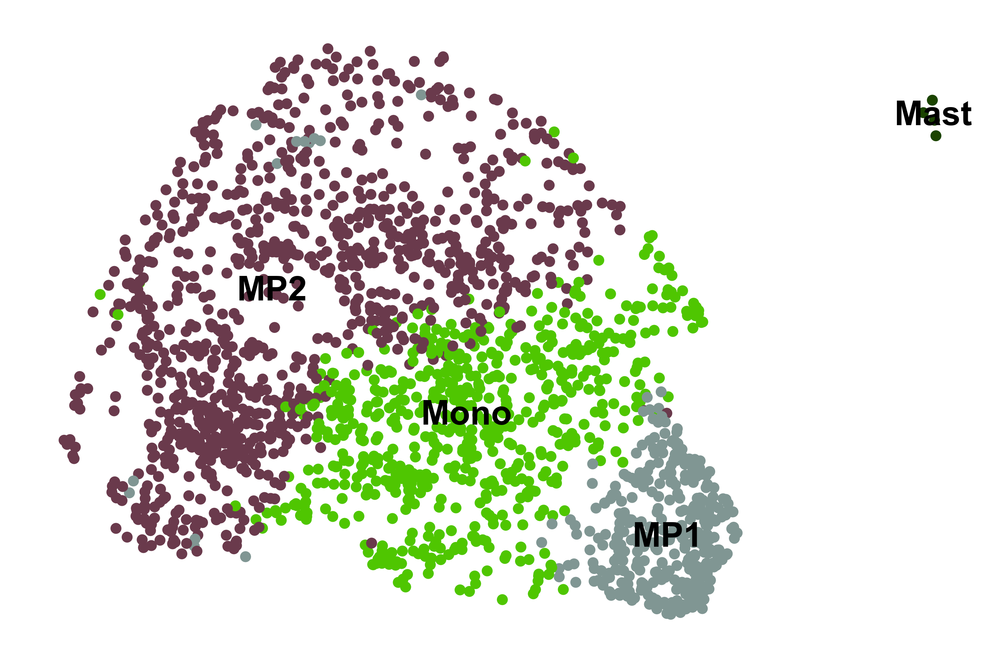

In [56]:
# check dim reduction
sc.pl.embedding(mye_adata, color='Cell_state', frameon=False, legend_loc='on data', title='', basis='subumap')

In [58]:
# compute velocity using stochastic mode
# scv.tl.velocity(mye_adata, mode = 'stochastic')

# or
# compute velocity using dynamical mode
scv.tl.recover_dynamics(mye_adata, n_jobs = 30)
scv.tl.velocity(mye_adata, mode = 'dynamical')

recovering dynamics (using 30/36 cores)


/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:713: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array([dm.alpha, dm.beta, dm.gamma, dm.pars[:3]]) / dm.m[-1]
/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scvelo/tools/dynamical_model.py:716: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must spec

    finished (0:00:29) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
computing velocities
    finished (0:00:01) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [59]:
scv.pp.neighbors(mye_adata)
scv.tl.velocity_graph(mye_adata)

computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing velocity graph (using 1/36 cores)
    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


/Users/Felix/opt/anaconda3/envs/cellrank/lib/python3.8/site-packages/scvelo/core/_parallelize.py:138: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = np.array(res) if as_array else res


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_subumap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_mye.scvelo_embedding.pdf


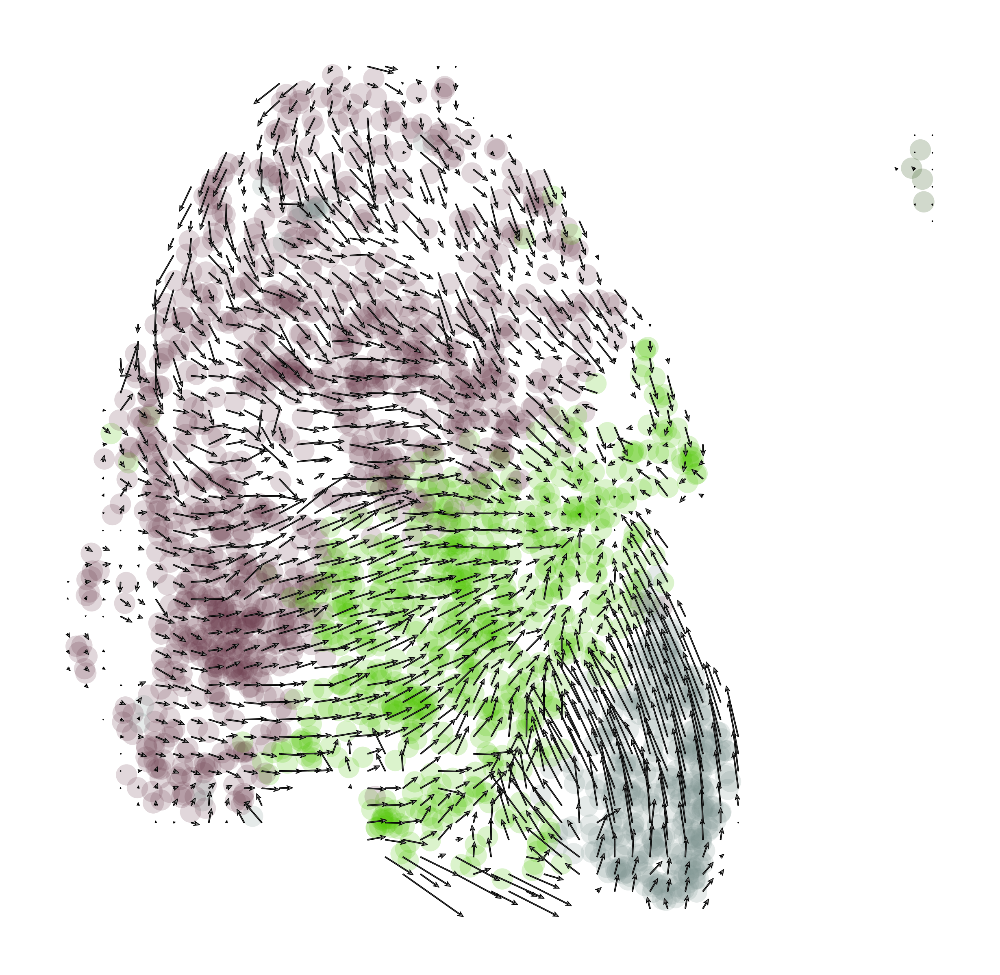

In [60]:
scv.pl.velocity_embedding_grid(mye_adata, basis='subumap', color='Cell_state', title='', scale=0.25, 
                               save='mye.scvelo_embedding.pdf', figsize=(5,5))

saving figure to file ./figures/scvelo_mye.embedding_stream.pdf


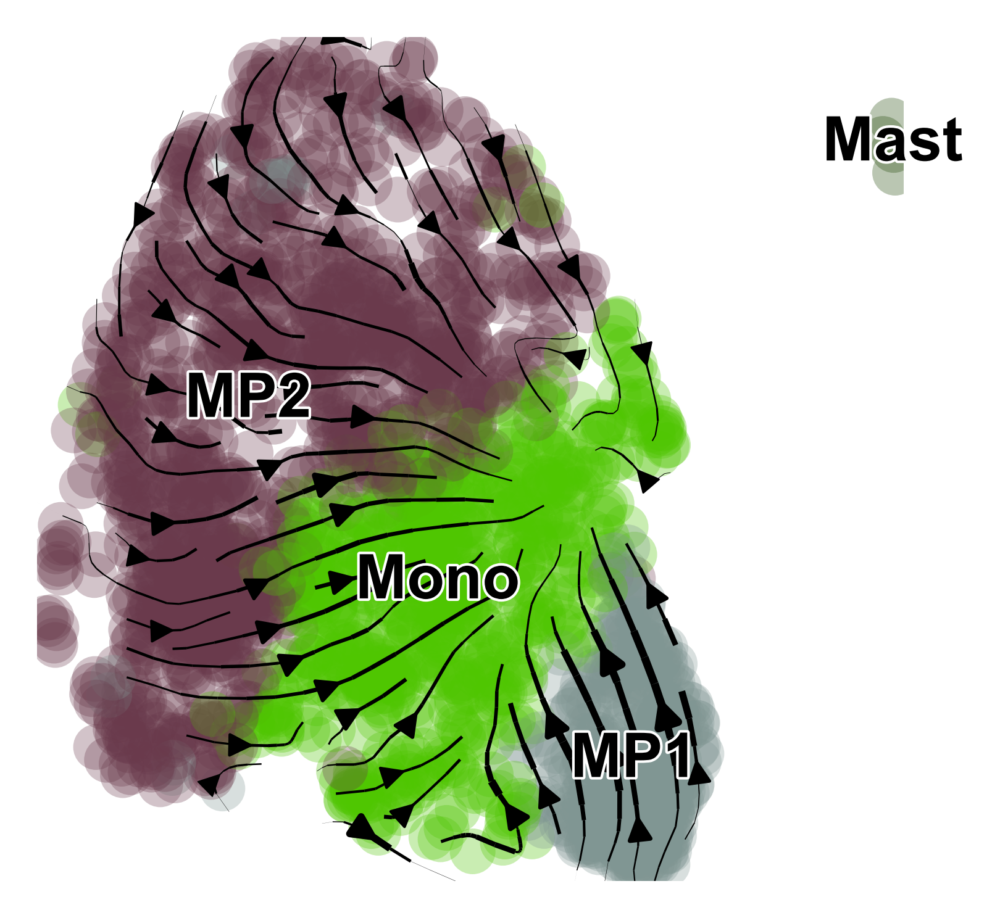

In [61]:
scv.pl.velocity_embedding_stream(mye_adata, basis='subumap', color=['Cell_state'], title='',
                                 min_mass=0.8, density=1,
                                 save='mye.embedding_stream.pdf', figsize=(3,3))

In [ ]:
# plot velocity of a selected gene
scv.pl.velocity(mye_adata, var_names=['NLRP3'], color='Cell_state', basis='subumap',
                save='mye.NAMPT_dynamics.pdf', figsize=(5,5))

In [ ]:
# latent time
scv.tl.latent_time(mye_adata)

In [ ]:
# pseudo time
scv.tl.velocity_pseudotime(mye_adata)

In [ ]:
scv.pl.scatter(mye_adata, color=['latent_time', 'velocity_pseudotime'], 
               color_map='viridis', size=40, basis='subumap',
               save='mye.dynamical_latent_time.pdf', figsize=(5,5))

In [ ]:
# PAGA analysis
scv.tl.rank_velocity_genes(mye_adata, groupby='Cell_state', min_corr=.3)

In [ ]:
mye_adata.uns['neighbors']['distances'] = mye_adata.obsp['distances']
mye_adata.uns['neighbors']['connectivities'] = mye_adata.obsp['connectivities']
scv.tl.paga(mye_adata, groups='Cell_state')

In [ ]:
scv.pl.paga(mye_adata, basis='subumap', size=30, alpha=.1, min_edge_width=2, node_size_scale=1.5, threshold=0,
            save='mye.paga.pdf', figsize=(5,5))

In [ ]:
# Velocity and Inference Confidence analysis
scv.tl.velocity_confidence(mye_adata)

In [ ]:
keys = 'velocity_length', 'velocity_confidence' ## Speed: length of the velocity vector Coherence: how well a velocity vector correlates to its neighbors
scv.pl.scatter(mye_adata, c=keys, cmap='coolwarm', perc=[5, 95], size = 30, basis='subumap',
               save='mye.velocity_length_confidence.pdf', figsize=(5,5))

In [ ]:
# Plot Velocity Graph (has bug -- not used)
# scv.pl.velocity_graph(mye_adata, threshold=0.2, color='Cell_state', which_graph='connectivities', basis='subumap')

In [ ]:
# get top latent time-correlated genes
top_genes = mye_adata.var['fit_likelihood'].sort_values(ascending=False).index[:200]

In [ ]:
top_genes

In [ ]:
scv.pl.heatmap(mye_adata, var_names=top_genes, sortby='latent_time', col_color='Cell_state', n_convolve=100, 
               save='mye.latent_time_fit_genes.png', figsize=(10,10))

In [ ]:
var_names = ['LYVE1', 'NLRP3', 'IL10']
scv.pl.scatter(mye_adata, var_names, color='Cell_state', frameon=False,
              save='mye.latent_time_fit_genes_velocity.pdf', figsize=(3,3))
scv.pl.scatter(mye_adata, x='latent_time', y=var_names, color='Cell_state', frameon=False,
              save='mye.latent_time_fit_genes_across_time.pdf', figsize=(3,3))

In [ ]:
# save dataset
mye_adata.write('/Volumes/bree/project/2022_hlhs_dturaga/rdata/human_v0/analysis/PART24.mye_scvelo.h5ad')

In [ ]:
#### End of myeloid cells analysis ####